In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas as pd
import plotly.express as px

from sklearn.model_selection import train_test_split
import sklearn

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn import metrics

# Load Data

In [2]:
df = pd.read_csv('customer_data.csv', sep=';')
df.head()

,State,Account_length,Area_code,International_plan,Voice_mail_plan,Number_vmail_messages,Total_day_minutes,Total_day_calls,Total_day_charge,Total_eve_minutes,...,Total_intl_minutes,Total_intl_calls,Total_intl_charge,Customer_service_calls,Churn,Churn_1,International_planNo,International_planYes,Voice_mail_planNo,Voice_mail_planYes
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,...,8.7,4,2.35,1,False,0.0,1,0,1,0
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,...,12.7,6,3.43,4,True,1.0,1,0,1,0
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,...,5.4,9,1.46,4,True,1.0,1,0,1,0
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,...,7.7,6,2.08,2,False,0.0,1,0,1,0
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,...,11.1,1,3.00,1,False,0.0,1,0,1,0


## Let's get general understanding of dataset

In [3]:
df.shape

(667, 25)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   667 non-null    object 
 1   Account_length          667 non-null    int64  
 2   Area_code               667 non-null    int64  
 3   International_plan      667 non-null    object 
 4   Voice_mail_plan         667 non-null    object 
 5   Number_vmail_messages   667 non-null    int64  
 6   Total_day_minutes       667 non-null    float64
 7   Total_day_calls         667 non-null    int64  
 8   Total_day_charge        667 non-null    float64
 9   Total_eve_minutes       667 non-null    float64
 10  Total_eve_calls         667 non-null    int64  
 11  Total_eve_charge        667 non-null    float64
 12  Total_night_minutes     667 non-null    float64
 13  Total_night_calls       667 non-null    int64  
 14  Total_night_charge      667 non-null    fl

In [5]:
df.describe()

,Account_length,Area_code,Number_vmail_messages,Total_day_minutes,Total_day_calls,Total_day_charge,Total_eve_minutes,Total_eve_calls,Total_eve_charge,Total_night_minutes,...,Total_night_charge,Total_intl_minutes,Total_intl_calls,Total_intl_charge,Customer_service_calls,Churn_1,International_planNo,International_planYes,Voice_mail_planNo,Voice_mail_planYes
count,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,...,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000,667.000000
mean,102.841079,436.157421,8.407796,180.948126,100.937031,30.761769,203.355322,100.476762,17.285262,199.685307,...,8.985907,10.238381,4.527736,2.764948,1.563718,0.142429,0.920540,0.079460,0.716642,0.283358
std,40.819480,41.783305,13.994480,55.508628,20.396790,9.436463,49.719268,18.948262,4.226160,49.759931,...,2.239429,2.807850,2.482442,0.758167,1.333357,0.349752,0.270659,0.270659,0.450967,0.450967
min,1.000000,408.000000,0.000000,25.900000,30.000000,4.400000,48.100000,37.000000,4.090000,23.200000,...,1.040000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,76.000000,408.000000,0.000000,146.250000,87.500000,24.860000,171.050000,88.000000,14.540000,167.950000,...,7.560000,8.600000,3.000000,2.320000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,102.000000,415.000000,0.000000,178.300000,101.000000,30.310000,203.700000,101.000000,17.310000,201.600000,...,9.070000,10.500000,4.000000,2.840000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
75%,128.000000,415.000000,20.000000,220.700000,115.000000,37.520000,236.450000,113.000000,20.095000,231.500000,...,10.420000,12.050000,6.000000,3.255000,2.000000,0.000000,1.000000,0.000000,1.000000,1.000000
max,232.000000,510.000000,51.000000,334.300000,165.000000,56.830000,361.800000,168.000000,30.750000,367.700000,...,16.550000,18.300000,18.000000,4.940000,8.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Check for na and duplicates

In [6]:
df.isna().sum()

State                     0
Account_length            0
Area_code                 0
International_plan        0
Voice_mail_plan           0
Number_vmail_messages     0
Total_day_minutes         0
Total_day_calls           0
Total_day_charge          0
Total_eve_minutes         0
Total_eve_calls           0
Total_eve_charge          0
Total_night_minutes       0
Total_night_calls         0
Total_night_charge        0
Total_intl_minutes        0
Total_intl_calls          0
Total_intl_charge         0
Customer_service_calls    0
Churn                     0
Churn_1                   0
International_planNo      0
International_planYes     0
Voice_mail_planNo         0
Voice_mail_planYes        0
dtype: int64

### Value Counts on int rows
- `International_planNo`, `International_planYes`, `Voice_mail_planNo` , `Voice_mail_planYes` are get dummies of `International_plan` and `Voice_mail_plan`
- `Times_Mailed`,`No_of_tradelines` are continous only have 8 values and are therefore somewhat catagorical

In [7]:
for col in df.select_dtypes(include='int64').columns:
    print(col,'\n', df[col].value_counts(), '\n')

Account_length 
 95     13
127    11
90     10
105    10
104     9
       ..
180     1
184     1
185     1
43      1
232     1
Name: Account_length, Length: 179, dtype: int64 

Area_code 
 415    337
408    169
510    161
Name: Area_code, dtype: int64 

Number_vmail_messages 
 0     478
29     14
36     11
27     10
31     10
28      9
26      9
30      9
33      9
22      8
35      8
32      8
39      8
20      8
34      6
41      6
23      6
21      6
19      5
24      5
37      4
25      4
38      3
40      3
16      2
17      2
14      2
11      2
48      2
42      2
45      2
18      1
46      1
49      1
15      1
13      1
51      1
Name: Number_vmail_messages, dtype: int64 

Total_day_calls 
 102    21
97     18
101    17
91     15
95     14
       ..
136     1
139     1
146     1
147     1
30      1
Name: Total_day_calls, Length: 100, dtype: int64 

Total_eve_calls 
 101    20
88     19
104    18
103    18
94     17
       ..
147     1
149     1
151     1
155     1
37      1
N

In [8]:
for col in df.select_dtypes(include='float64').columns:
    print(col,'\n', df[col].value_counts(), '\n')

Total_day_minutes 
 153.5    4
189.8    4
220.7    3
167.8    3
183.6    3
        ..
44.9     1
267.1    1
224.3    1
155.7    1
184.5    1
Name: Total_day_minutes, Length: 562, dtype: int64 

Total_day_charge 
 26.10    4
32.27    4
39.46    3
28.53    3
26.32    3
        ..
26.84    1
20.06    1
33.81    1
28.78    1
39.25    1
Name: Total_day_charge, Length: 562, dtype: int64 

Total_eve_minutes 
 180.5    4
215.6    4
183.6    4
203.9    4
210.8    3
        ..
214.7    1
175.8    1
350.5    1
213.7    1
228.5    1
Name: Total_eve_minutes, Length: 557, dtype: int64 

Total_eve_charge 
 18.33    5
15.61    4
18.67    4
17.33    4
15.34    4
        ..
17.07    1
13.78    1
13.36    1
26.62    1
18.58    1
Name: Total_eve_charge, Length: 528, dtype: int64 

Total_night_minutes 
 231.5    4
210.1    4
188.2    4
127.1    3
170.8    3
        ..
159.4    1
188.8    1
257.6    1
196.8    1
138.0    1
Name: Total_night_minutes, Length: 568, dtype: int64 

Total_night_charge 
 9.45    6

In [9]:
for col in df.select_dtypes(include='object').columns:
    print(col,'\n', df[col].value_counts(), '\n')

State 
 AZ    19
WV    18
NM    18
ND    18
KS    18
NJ    18
WA    18
IN    17
WI    17
ID    17
MS    17
RI    17
TX    17
KY    16
LA    16
NE    16
VT    16
OR    16
NY    15
MI    15
MT    15
CT    15
MN    14
AL    14
MA    13
IL    13
NH    13
ME    13
NC    12
UT    12
MO    12
OH    12
TN    12
SC    11
WY    11
SD    11
DE    10
CA    10
MD    10
VA    10
AK     9
DC     9
PA     9
FL     9
HI     9
OK     9
AR     8
CO     7
IA     6
NV     5
GA     5
Name: State, dtype: int64 

International_plan 
 No     614
Yes     53
Name: International_plan, dtype: int64 

Voice_mail_plan 
 No     478
Yes    189
Name: Voice_mail_plan, dtype: int64 



## Let's graph int and catagorical like columns

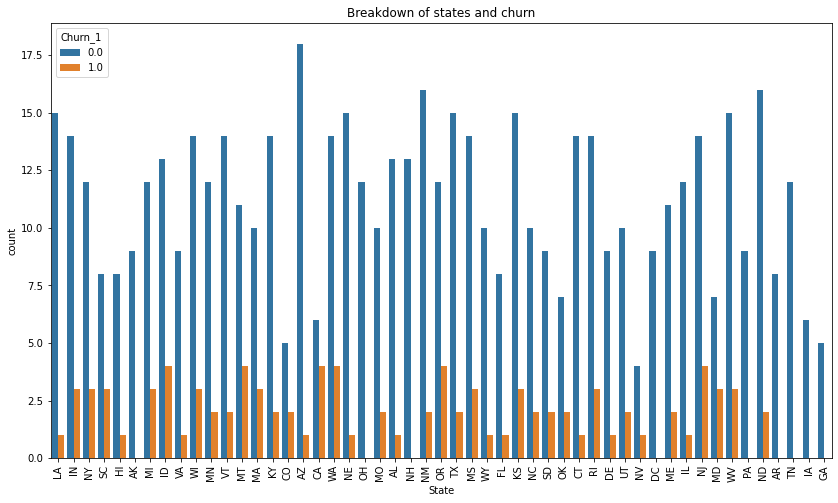

In [10]:
plt.figure(figsize=(14,8))
g=sns.countplot(x='State', hue="Churn_1", data=df)
plt.xticks(rotation=90)
plt.title('Breakdown of states and churn')
plt.savefig('figures/states_and_churn')

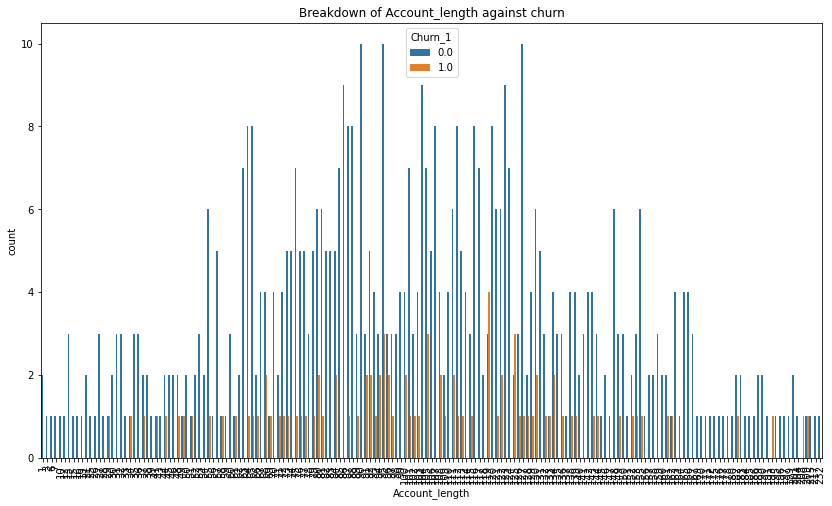

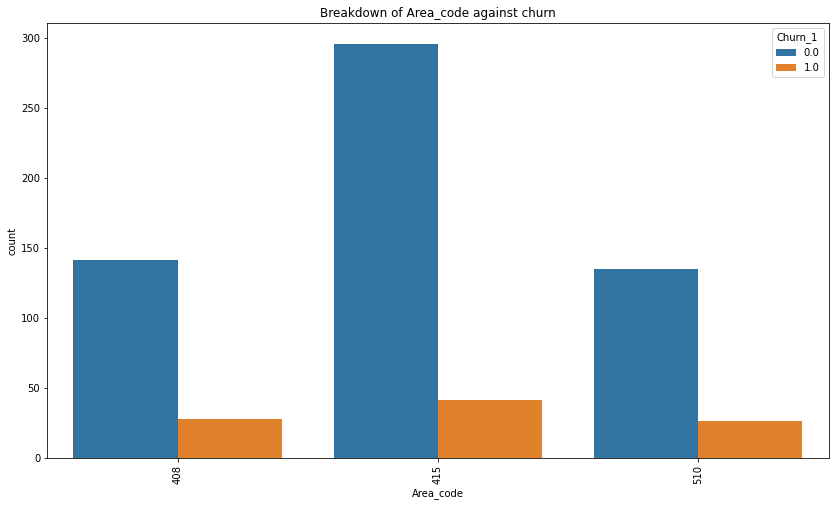

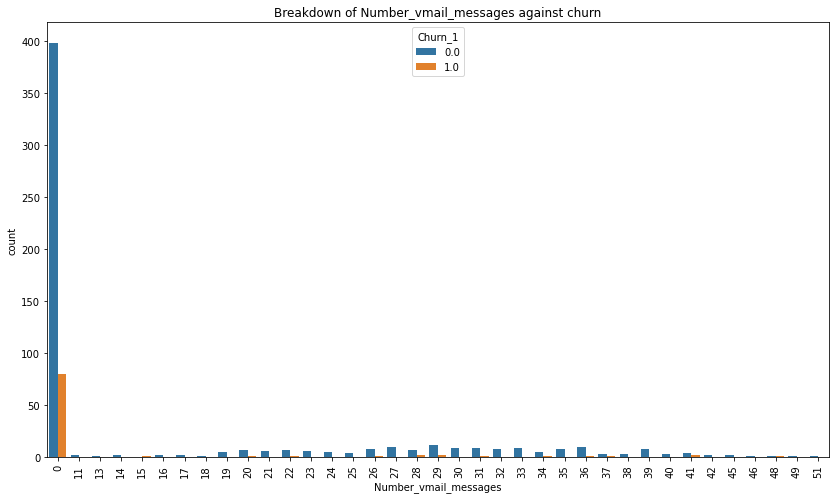

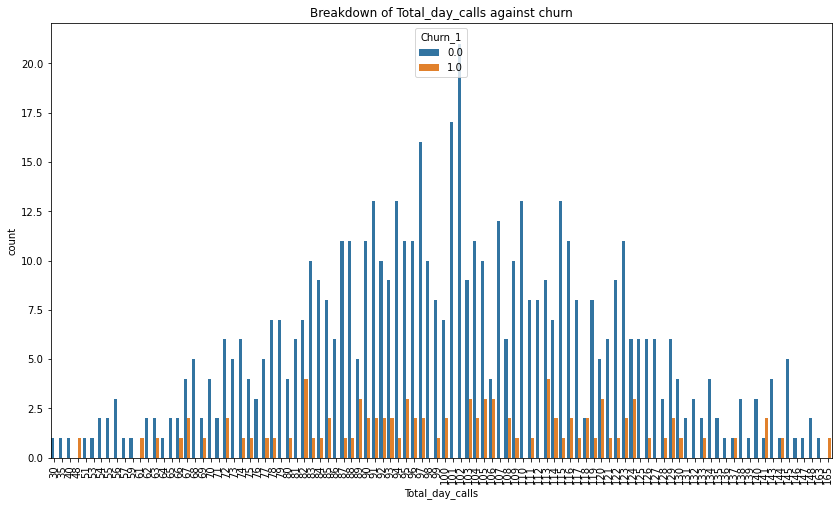

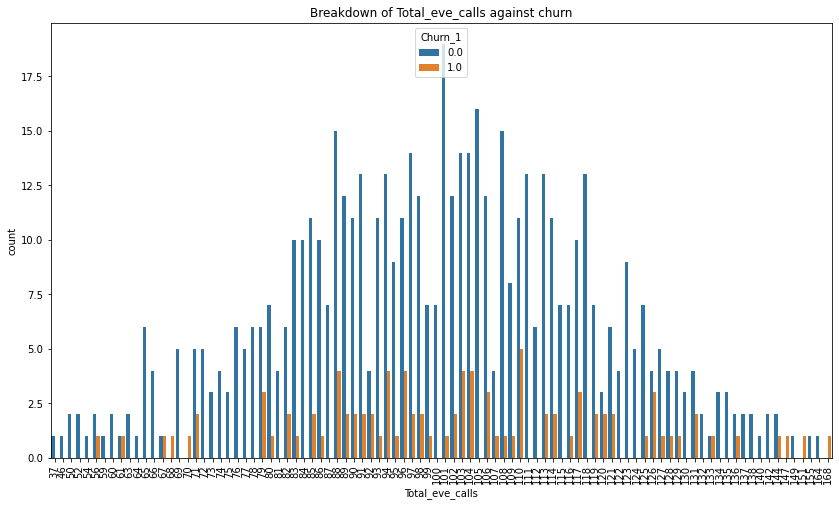

...

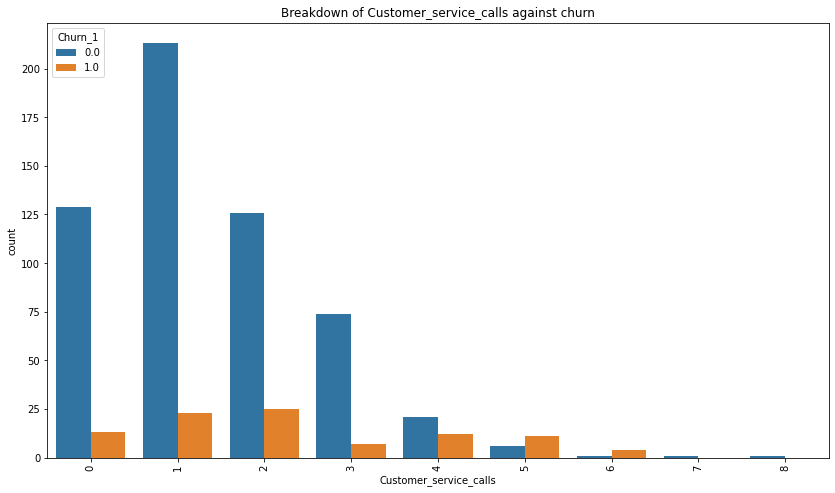

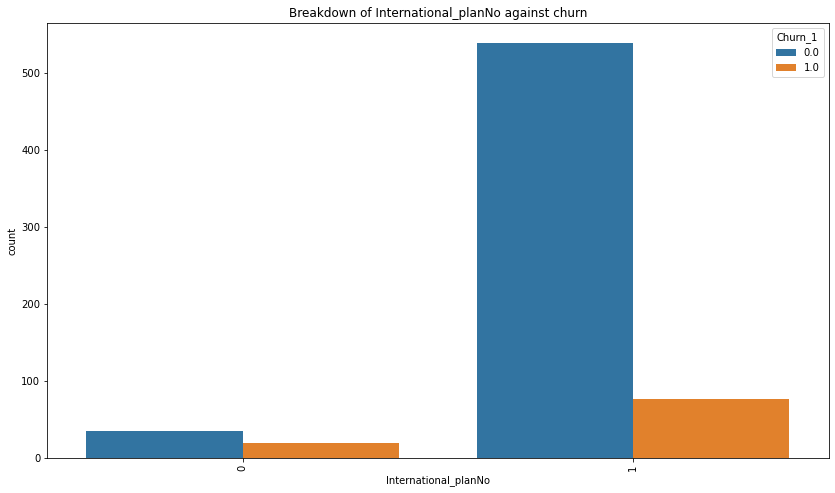

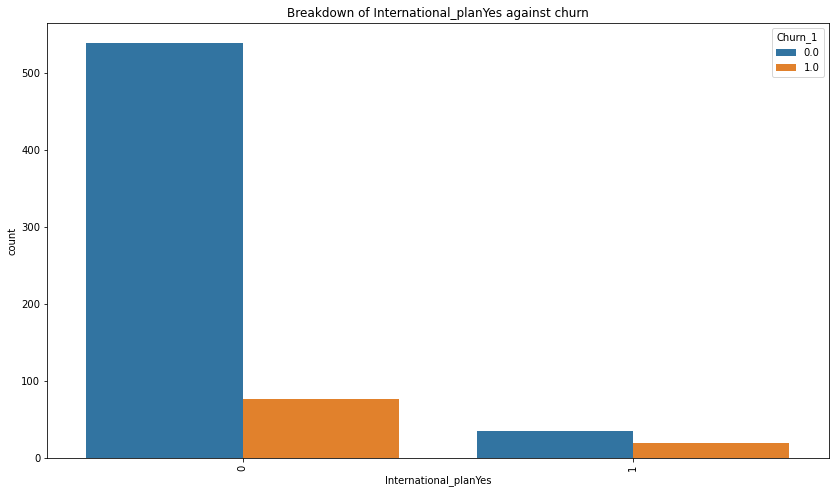

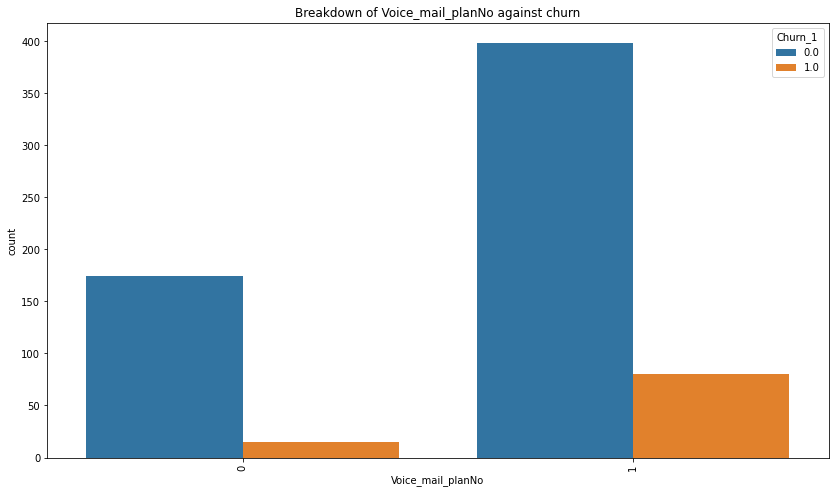

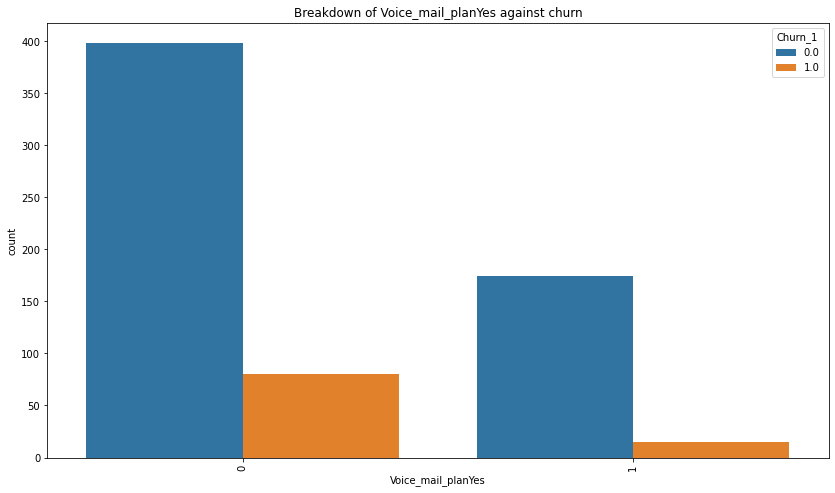

In [11]:
for col in df.select_dtypes(include='int64').columns:
    plt.figure(figsize=(14,8))
    g=sns.countplot(x=col, hue="Churn_1", data=df)
    plt.xticks(rotation=90)
    plt.title('Breakdown of '+col+' against churn')
    plt.savefig('figures/churn_'+col)

## Plot continous variables

/Users/gabrielseemann/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/gabrielseemann/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


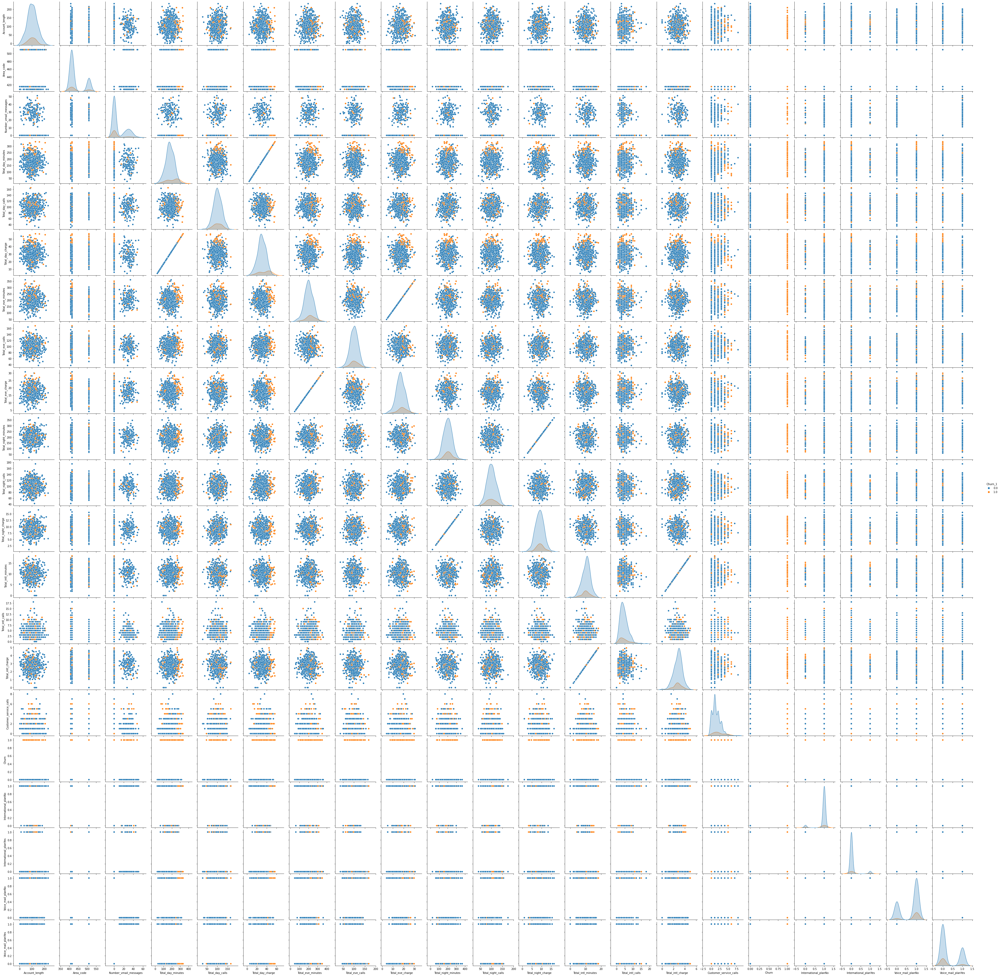

In [12]:
sns_plot= sns.pairplot(df, hue='Churn_1')#, hue="species", tit)
sns_plot.savefig("figures/Churn_continous'")
# plt.title('Relationship between Continous Variables and Churn')
# plt.savefig('figures/Churn_continous')

Hmmmm looks like amount charged may be related to Churn
Let's make a total charge column

In [13]:
df['total_charge']=df.Total_day_charge+df.Total_eve_charge+df.Total_night_charge+df.Total_intl_charge

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   667 non-null    object 
 1   Account_length          667 non-null    int64  
 2   Area_code               667 non-null    int64  
 3   International_plan      667 non-null    object 
 4   Voice_mail_plan         667 non-null    object 
 5   Number_vmail_messages   667 non-null    int64  
 6   Total_day_minutes       667 non-null    float64
 7   Total_day_calls         667 non-null    int64  
 8   Total_day_charge        667 non-null    float64
 9   Total_eve_minutes       667 non-null    float64
 10  Total_eve_calls         667 non-null    int64  
 11  Total_eve_charge        667 non-null    float64
 12  Total_night_minutes     667 non-null    float64
 13  Total_night_calls       667 non-null    int64  
 14  Total_night_charge      667 non-null    fl

/Users/gabrielseemann/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/gabrielseemann/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


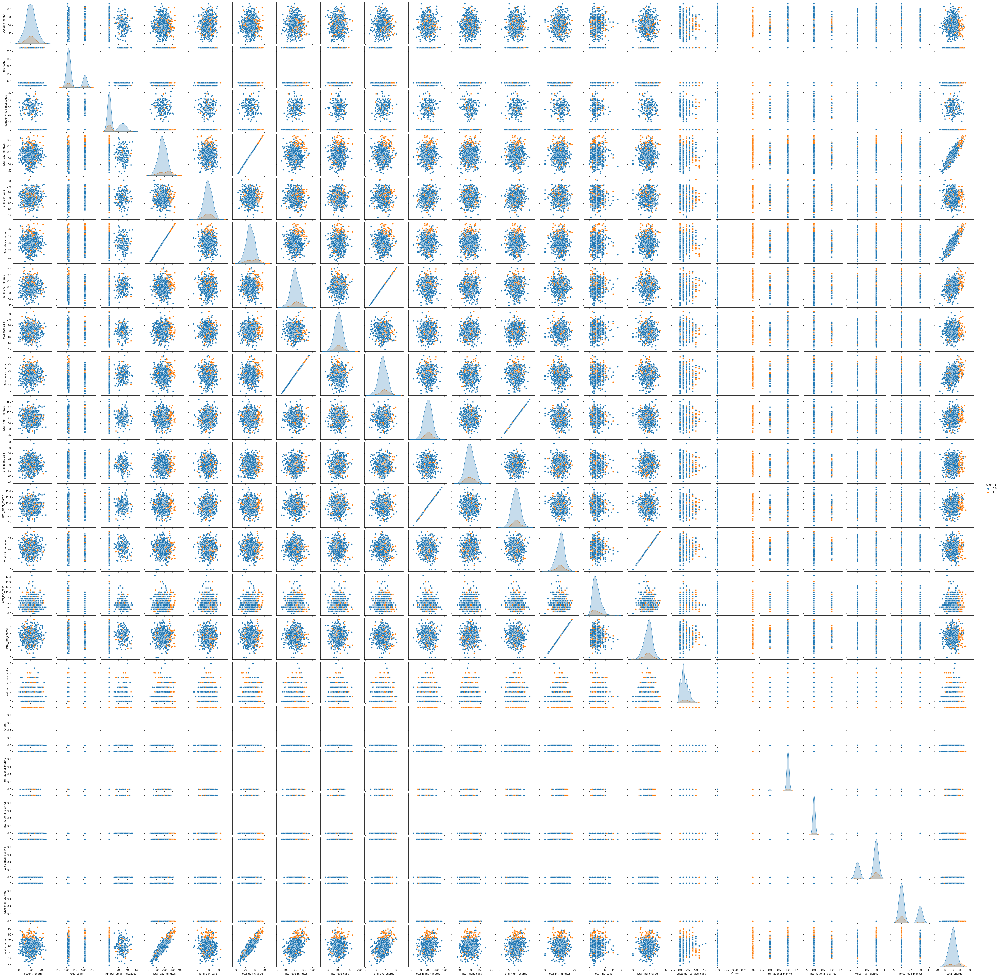

In [15]:
sns_plot= sns.pairplot(df, hue='Churn_1')#, hue="species", tit)
# sns_plot.savefig("figures/Churn_continous'")

- There seems to be some correlation between high total_charge and Churn
- Perhaps a coupon/discount could mitigate Churn

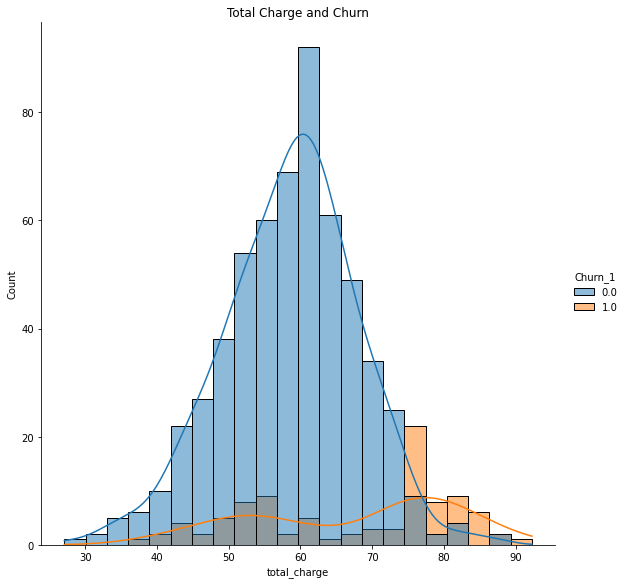

In [16]:
sns.displot(data=df,x='total_charge',kde=True, kind='hist', hue='Churn_1', height=8)
plt.title("Total Charge and Churn")
plt.savefig("figures/total_charge_churn",bbox_inches='tight')

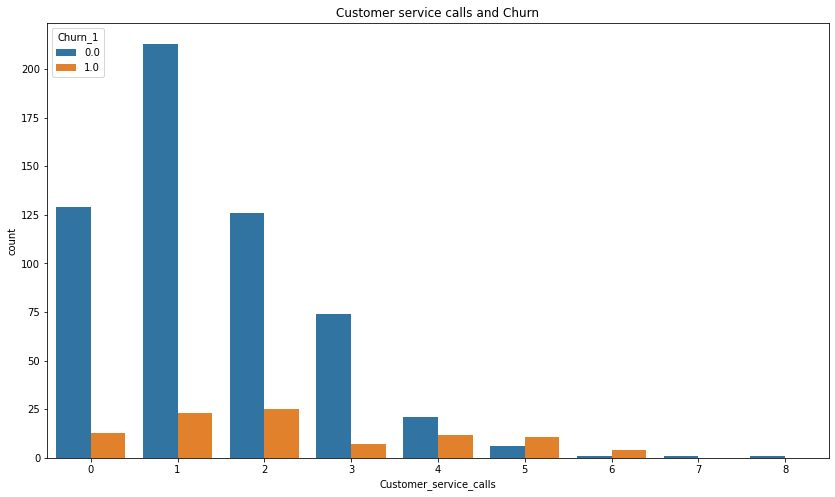

In [17]:
plt.figure(figsize=(14,8))
g=sns.countplot(x='Customer_service_calls', hue="Churn_1", data=df)
plt.title("Customer service calls and Churn")
plt.savefig("figures/customer_calls_churn")

## Split data into train and testing
- we will try to predict `Churn_1`
- we need to address the imbalence in `Churn_1`

In [18]:
predictors =['State','Account_length', 'Area_code', 
        'Number_vmail_messages', 'Total_day_minutes',
       'Total_day_calls', 'Total_day_charge', 'Total_eve_minutes',
       'Total_eve_calls', 'Total_eve_charge', 'Total_night_minutes',
       'Total_night_calls', 'Total_night_charge', 'Total_intl_minutes',
       'Total_intl_calls', 'Total_intl_charge', 'Customer_service_calls',
        'International_planYes', 'Voice_mail_planYes']

In [19]:
df.Churn_1.value_counts()

0.0    572
1.0     95
Name: Churn_1, dtype: int64

### Get dummies for catagorical predictors 
 - `International_planNo/YES`, `Voice_mail_planYes/NO` <- already in binary format
 - `State` are str(object) time -> getdummies can be used
 - well also convert `Area_code` to str so its captured by get dummies

In [20]:
df.Area_code= df.Area_code.astype('object')

### Assign y and X then break into train/test sets

In [31]:
y = df[["Churn_1"]]
X = pd.get_dummies(df.loc[:,predictors])

# Perform test train split
X_train , X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=122)

In [32]:
y.value_counts()

Churn_1
0.0        572
1.0         95
dtype: int64

In [33]:
y_train.value_counts()

Churn_1
0.0        458
1.0         75
dtype: int64

### Start by Over-sampling Churn_1


In [34]:
df_train = pd.concat([X_train, y_train], axis=1)

In [35]:
# Class count
count_class_0, count_class_1 = df_train.Churn_1.value_counts()

In [36]:
df_train.Churn_1.value_counts()

0.0    458
1.0     75
Name: Churn_1, dtype: int64

In [37]:
df_class_0 = df_train[df_train['Churn_1'] == 0]
df_class_1 = df_train[df_train['Churn_1'] == 1]

In [38]:
#oversampling
df_class_1_over = df_class_1.sample(n=count_class_0,replace=True)
df_test_under = pd.concat([df_class_1_over, df_class_0], axis=0)

#balanced y_train and X_train
y_train = df_test_under['Churn_1']
X_train = df_test_under.iloc[:,:-1]

In [39]:
y_train.value_counts()

0.0    458
1.0    458
Name: Churn_1, dtype: int64

## Models

### Logistic Regression

In [41]:
logreg = LogisticRegression(C=.1, max_iter=10000, penalty='elasticnet', verbose=1,
                             solver='saga',random_state=12,l1_ratio=.9, n_jobs=-1)
logreg.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


convergence after 6447 epochs took 4 seconds


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    3.7s finished


LogisticRegression(C=0.1, l1_ratio=0.9, max_iter=10000, n_jobs=-1,
                   penalty='elasticnet', random_state=12, solver='saga',
                   verbose=1)

In [42]:
best_parameters = logreg.best_params_

print('Grid Search found the following optimal parameters: ')
for param_name in sorted(best_parameters.keys()):
    print('%s: %r' % (param_name, best_parameters[param_name]))


AttributeError: 'LogisticRegression' object has no attribute 'best_params_'

In [45]:
dictionary = dict(zip(list(X_train.columns), list(logreg.coef_[0])))
dictionary

{'Account_length': -0.0037788375118127013,
 'Number_vmail_messages': -0.023765677140266898,
 'Total_day_minutes': 0.012773428691402963,
 'Total_day_calls': -0.0037496222023551064,
 'Total_day_charge': 0.0,
 'Total_eve_minutes': 0.007948877319826715,
 'Total_eve_calls': -0.018498824301261336,
 'Total_eve_charge': 0.0,
 'Total_night_minutes': 0.0009291066898385014,
 'Total_night_calls': -0.013624208444701087,
 'Total_night_charge': 0.0,
 'Total_intl_minutes': -0.06872633798701419,
 'Total_intl_calls': -0.01065469231669879,
 'Total_intl_charge': 0.0,
 'Customer_service_calls': 0.5360889803243025,
 'International_planYes': 0.7958628237141733,
 'Voice_mail_planYes': 0.0,
 'State_AK': 0.0,
 'State_AL': 0.0,
 'State_AR': 0.0,
 'State_AZ': 0.0,
 'State_CA': 0.0,
 'State_CO': 0.0,
 'State_CT': 0.0,
 'State_DC': 0.0,
 'State_DE': 0.0,
 'State_FL': 0.0,
 'State_GA': 0.0,
 'State_HI': 0.0,
 'State_IA': 0.0,
 'State_ID': 0.0,
 'State_IL': 0.0,
 'State_IN': 0.0,
 'State_KS': 0.0,
 'State_KY': 0.0,
 

In [46]:
y_pred_class = logreg.predict(X_test)
y_pred_train = logreg.predict(X_train)

In [47]:
accuracy= metrics.accuracy_score(y_test, y_pred_class)
recall= metrics.recall_score(y_test, y_pred_class)
precision= metrics.precision_score(y_test, y_pred_class)
f1= metrics.f1_score(y_test, y_pred_class)
tnr = metrics.recall_score(y_test, y_pred_class, pos_label = 0)
fpr = 1 - tnr

t_accuracy = metrics.accuracy_score(y_train, y_pred_train)
t_recall = metrics.recall_score(y_train, y_pred_train)
t_precision=metrics.precision_score(y_train, y_pred_train)
t_f1=metrics.f1_score(y_train, y_pred_train)
t_tnr = metrics.recall_score(y_train, y_pred_train, pos_label = 0)
t_fpr = 1 - t_tnr

print('Positive likelihood ratio',recall/fpr)
print('recall_score', recall)
print('precision_score', precision)
print('accuracy_score', accuracy)
print('f1_score', f1)

print('\nTraining Data')
print('Positive likelihood ratio',t_recall/t_fpr)
print('recall_score', t_recall)
print('precision_score', t_precision)
print('accuracy_score', t_accuracy)
print('f1_score', t_f1)

Positive likelihood ratio 1.4999999999999998
recall_score 0.5
precision_score 0.20833333333333334
accuracy_score 0.6417910447761194
f1_score 0.29411764705882354

Training Data
Positive likelihood ratio 3.2894736842105257
recall_score 0.8187772925764192
precision_score 0.7668711656441718
accuracy_score 0.7849344978165939
f1_score 0.791974656810982


In [48]:
recall = metrics.recall_score(y_test, y_pred_class)
print('recall_score', metrics.recall_score(y_test, y_pred_class))
tnr = metrics.recall_score(y_test, y_pred_class, pos_label = 0)
print('tnr', tnr)
fpr = 1 - tnr
print('fpr', fpr)
print('Positive likelihood ratio',recall/fpr)

recall_score 0.5
tnr 0.6666666666666666
fpr 0.33333333333333337
Positive likelihood ratio 1.4999999999999998


In [49]:
y_pred_class

array([0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0.,
       1., 1., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 1., 1., 0., 1., 1., 0., 1., 0., 1., 1., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 1., 1., 0., 0., 1.,
       0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0.,
       1., 0., 0., 1., 0., 0., 0., 1., 1., 0., 0., 0., 1., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1.,
       0., 0., 0., 0., 1., 0., 1., 0., 1., 1., 0., 1., 0., 1., 1.])

In [50]:
pd.concat([pd.DataFrame(data=[metrics.accuracy_score(y_test, y_pred_class), metrics.recall_score(y_test, y_pred_class),
                   metrics.precision_score(y_test, y_pred_class), metrics.f1_score(y_test, y_pred_class)], 
             index=["accuracy", "recall", "precision", "F1"]).rename(columns={0:'test_set'}),
pd.DataFrame(data=[metrics.accuracy_score(y_train, y_pred_train), metrics.recall_score(y_train, y_pred_train),
                   metrics.precision_score(y_train, y_pred_train), metrics.f1_score(y_train, y_pred_train)], 
             index=["accuracy", "recall", "precision", "F1"]).rename(columns={0:'train_set'})], axis=1)

,test_set,train_set
accuracy,0.641791,0.784934
recall,0.500000,0.818777
precision,0.208333,0.766871
F1,0.294118,0.791975


Text(0.5, 1.0, 'Confusion Matrix Logistic Regression Testing')

<Figure size 432x288 with 0 Axes>

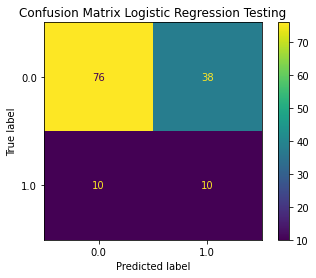

In [51]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm=confusion_matrix(y_test, y_pred_class)
disp=ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=logreg.classes_)
plt.savefig("figures/Confusion_Matrix_Logreg")
disp.plot()
plt.title('Confusion Matrix Logistic Regression Testing')

#### Pseudo R^2 assessment

In [56]:
w = np.array(logreg.coef_).transpose()
y_pred = logreg.predict_proba(X_train)[:, 1]

##### Efron's R^2

In [57]:
def efron_rsquare(y, y_pred):
    n = float(len(y))
    t1 = np.sum(np.power(y - y_pred, 2.0))
    t2 = np.sum(np.power((y - (np.sum(y) / n)), 2.0))
    return 1.0 - (t1 / t2)
efron_rsquare(np.ravel(y_train), y_pred)

0.3317867004189933

##### McFadden’s  R^2

In [58]:
def full_log_likelihood(w, X, y):
    score = np.dot(X, w).reshape(1, X.shape[0])
    return np.sum(-np.log(1 + np.exp(score))) + np.sum(y * score)

def null_log_likelihood(w, X, y):
    z = np.array([w if i == 0 else 0.0 for i, w in enumerate(w.reshape(1, X.shape[1])[0])]).reshape(X.shape[1], 1)
    score = np.dot(X, z).reshape(1, X.shape[0])
    return np.sum(-np.log(1 + np.exp(score))) + np.sum(y * score)

def mcfadden_rsquare(w, X, y):
    return 1.0 - (full_log_likelihood(w, X, y) / null_log_likelihood(w, X, y))

def mcfadden_adjusted_rsquare(w, X, y):
    k = float(X.shape[1])
    return 1.0 - ((full_log_likelihood(w, X, y) - k) / null_log_likelihood(w, X, y))

#get score
mcfadden_rsquare(w, X_train, np.ravel(y_train))
# mcfadden_rsquare(w, X_test, np.ravel(y_test))

0.26794379570810234

#### ROC

In [59]:
# store the predicted probabilities for class 1
y_pred_prob = logreg.predict_proba(X_test)[:, 1]

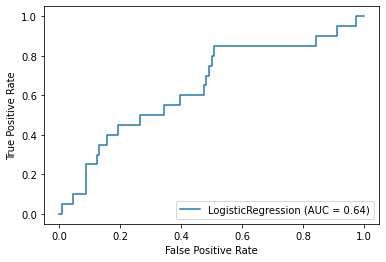

In [60]:
metrics.plot_roc_curve(logreg, X_test, y_test) 

### Random Forest

In [61]:
grid_for = RandomForestClassifier(n_estimators=400, criterion='gini', max_depth=4, min_samples_split=.0001,
        min_samples_leaf=1,min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, 
        min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=True, n_jobs=-1, 
        random_state=22, verbose=2,warm_start=False, class_weight=None, ccp_alpha=0.015, max_samples=.5)


# param_grid = {
#     'criterion':['gini'],
#     'max_depth': [4],
#     'max_samples':[.5],
#     'min_samples_split': [.0001],
#     'min_samples_leaf':[1],
#     'n_estimators': [400,600,800],
#     'ccp_alpha':[.015]
# }

# grid_for = GridSearchCV(forest, param_grid, scoring='f1', cv=10, n_jobs=-1)
grid_for.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    0.2s


building tree 1 of 400building tree 2 of 400

building tree 3 of 400
building tree 4 of 400
building tree 5 of 400building tree 6 of 400
building tree 7 of 400

building tree 8 of 400building tree 9 of 400

building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400building tree 14 of 400

building tree 15 of 400building tree 16 of 400

building tree 17 of 400
building tree 18 of 400building tree 19 of 400

building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400building tree 27 of 400

building tree 28 of 400
building tree 29 of 400building tree 30 of 400

building tree 31 of 400building tree 32 of 400building tree 33 of 400

building tree 34 of 400building tree 35 of 400


building tree 36 of 400building tree 37 of 400

building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
b

[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed:    0.6s finished


RandomForestClassifier(ccp_alpha=0.015, max_depth=4, max_samples=0.5,
                       min_samples_split=0.0001, n_estimators=400, n_jobs=-1,
                       oob_score=True, random_state=22, verbose=2)

In [62]:
# best_parameters = grid_for.best_params_

# print('Grid Search found the following optimal parameters: ')
# for param_name in sorted(best_parameters.keys()):
#     print('%s: %r' % (param_name, best_parameters[param_name]))

In [63]:
# make class predictions for the testing set
y_pred_class = grid_for.predict(X_test)
y_pred_train = grid_for.predict(X_train)

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 138 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 341 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 138 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 341 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done 400 out of 400 | elapsed:    0.1s finished


In [64]:
accuracy= metrics.accuracy_score(y_test, y_pred_class)
recall= metrics.recall_score(y_test, y_pred_class)
precision= metrics.precision_score(y_test, y_pred_class)
f1= metrics.f1_score(y_test, y_pred_class)
tnr = metrics.recall_score(y_test, y_pred_class, pos_label = 0)
fpr = 1 - tnr

t_accuracy = metrics.accuracy_score(y_train, y_pred_train)
t_recall = metrics.recall_score(y_train, y_pred_train)
t_precision=metrics.precision_score(y_train, y_pred_train)
t_f1=metrics.f1_score(y_train, y_pred_train)
t_tnr = metrics.recall_score(y_train, y_pred_train, pos_label = 0)
t_fpr = 1 - t_tnr

accuracy= metrics.accuracy_score(y_test, y_pred_class)
recall= metrics.recall_score(y_test, y_pred_class)
precision= metrics.precision_score(y_test, y_pred_class)
f1= metrics.f1_score(y_test, y_pred_class)
tnr = metrics.recall_score(y_test, y_pred_class, pos_label = 0)
fpr = 1 - tnr

t_accuracy = metrics.accuracy_score(y_train, y_pred_train)
t_recall = metrics.recall_score(y_train, y_pred_train)
t_precision=metrics.precision_score(y_train, y_pred_train)
t_f1=metrics.f1_score(y_train, y_pred_train)
t_tnr = metrics.recall_score(y_train, y_pred_train, pos_label = 0)
t_fpr = 1 - t_tnr

print('Testing Data')
print('Positive likelihood ratio',recall/fpr)
print('recall_score', recall)
print('precision_score', precision)
print('accuracy_score', accuracy)
print('balanced accuracy_score', metrics.balanced_accuracy_score(y_test, y_pred_class))
print('f1_score', f1)
print(sklearn.metrics.classification_report(y_test, y_pred_class))

print('\nTraining Data')
print('Positive likelihood ratio',t_recall/t_fpr)
print('recall_score', t_recall)
print('precision_score', t_precision)
print('accuracy_score', t_accuracy)
print('f1_score', t_f1)


Testing Data
Positive likelihood ratio 4.6312500000000005
recall_score 0.65
precision_score 0.4482758620689655
accuracy_score 0.8283582089552238
balanced accuracy_score 0.7548245614035087
f1_score 0.5306122448979592
              precision    recall  f1-score   support

         0.0       0.93      0.86      0.89       114
         1.0       0.45      0.65      0.53        20

    accuracy                           0.83       134
   macro avg       0.69      0.75      0.71       134
weighted avg       0.86      0.83      0.84       134


Training Data
Positive likelihood ratio 8.702127659574472
recall_score 0.8930131004366813
precision_score 0.8969298245614035
accuracy_score 0.8951965065502183
f1_score 0.8949671772428884


In [65]:
pd.concat([pd.DataFrame(data=[metrics.accuracy_score(y_test, y_pred_class), metrics.recall_score(y_test, y_pred_class),
                   metrics.precision_score(y_test, y_pred_class), metrics.f1_score(y_test, y_pred_class)], 
             index=["accuracy", "recall", "precision", "F1"]).rename(columns={0:'test_set'}),
pd.DataFrame(data=[metrics.accuracy_score(y_train, y_pred_train), metrics.recall_score(y_train, y_pred_train),
                   metrics.precision_score(y_train, y_pred_train), metrics.f1_score(y_train, y_pred_train)], 
             index=["accuracy", "recall", "precision", "F1"]).rename(columns={0:'train_set'})], axis=1)

,test_set,train_set
accuracy,0.828358,0.895197
recall,0.650000,0.893013
precision,0.448276,0.896930
F1,0.530612,0.894967


Text(0.5, 1.0, 'Confusion Matrix Forest Testing')

<Figure size 432x288 with 0 Axes>

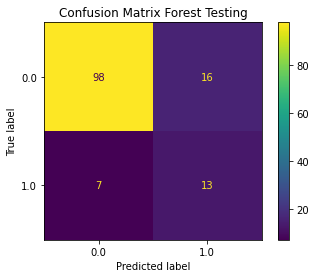

In [66]:
cm=confusion_matrix(y_test, y_pred_class)
disp=ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=grid_for.classes_)
plt.savefig("figures/Confusion_Matrix_forest")
disp.plot()
plt.title('Confusion Matrix Forest Testing')

In [67]:
#function used to plot feature importance greater than zero
def plot_feature_importances(model, name=''):
    #get feature importance
    dic={}
    for col,val in zip(X_train.columns, model.feature_importances_):
        dic[col]=val
    dic =dict(sorted(dic.items(), key=lambda item: item[1], reverse=True))
    #remove all zero values
    rm=[]
    for d,k in dic.items():
        if k==0:
            rm.append(d)
    for i in rm:
        dic.pop(i)
    #graph importance
    plt.figure(figsize=(40,40))
    ax = sns.barplot(x=list(dic.values()), y=list(dic.keys()), palette="Blues_d")
    plt.title("Feature Importance "+name+ " Model", fontsize=50)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.xlabel('Feature importance', fontsize=30)
    plt.ylabel('Features', fontsize=30)
    if name:
        plt.savefig("figures/Feature_Importance_"+name, bbox_inches='tight')

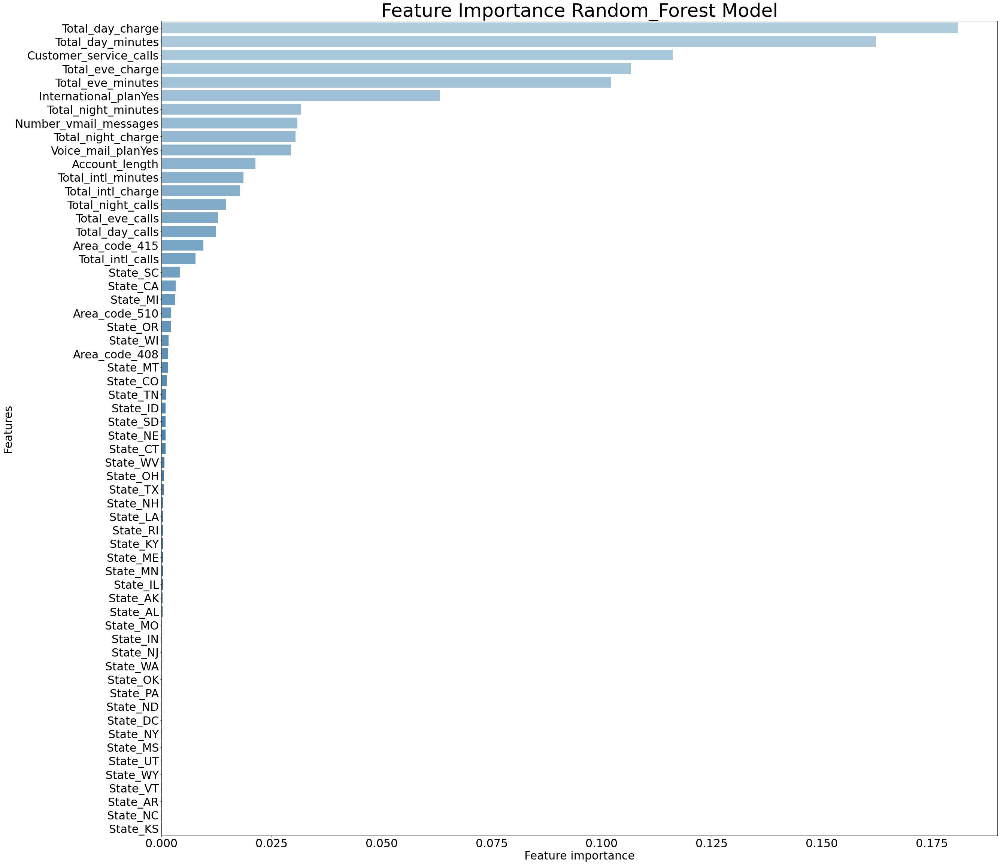

In [68]:
plot_feature_importances(grid_for, 'Random_Forest')

### XGBoost

In [69]:
from xgboost import XGBClassifier
xgb = XGBClassifier(base_score=0.5, booster='gbtree', subsample=.6, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1,
              learning_rate=0.4, max_delta_step=0, max_depth=4, min_split_loss=1,
              min_child_weight=1, missing=None, n_estimators=700, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=22,
              reg_alpha=3, reg_lambda=125, scale_pos_weight=1, seed=None,
              silent=None, verbosity=1)

# Grid Search found the following optimal parameters: 
# learning_rate: 0.4
# max_delta_step: 0
# max_depth: 4
# min_child_weight: 1
# min_split_loss: 1
# n_estimators: 700
# reg_alpha: 3
# reg_lambda: 125
# subsample: 0.6

In [70]:
xgb.fit(X_train, y_train)

XGBClassifier(learning_rate=0.4, max_depth=4, min_split_loss=1,
              n_estimators=700, n_jobs=-1, random_state=22, reg_alpha=3,
              reg_lambda=125, subsample=0.6)

In [71]:
# make class predictions for the testing set
y_pred_class = xgb.predict(X_test)
y_pred_train = xgb.predict(X_train)

In [72]:
accuracy= metrics.accuracy_score(y_test, y_pred_class)
recall= metrics.recall_score(y_test, y_pred_class)
precision= metrics.precision_score(y_test, y_pred_class)
f1= metrics.f1_score(y_test, y_pred_class)
tnr = metrics.recall_score(y_test, y_pred_class, pos_label = 0)
fpr = 1 - tnr

t_accuracy = metrics.accuracy_score(y_train, y_pred_train)
t_recall = metrics.recall_score(y_train, y_pred_train)
t_precision=metrics.precision_score(y_train, y_pred_train)
t_f1=metrics.f1_score(y_train, y_pred_train)
t_tnr = metrics.recall_score(y_train, y_pred_train, pos_label = 0)
t_fpr = 1 - t_tnr

accuracy= metrics.accuracy_score(y_test, y_pred_class)
recall= metrics.recall_score(y_test, y_pred_class)
precision= metrics.precision_score(y_test, y_pred_class)
f1= metrics.f1_score(y_test, y_pred_class)
tnr = metrics.recall_score(y_test, y_pred_class, pos_label = 0)
fpr = 1 - tnr

t_accuracy = metrics.accuracy_score(y_train, y_pred_train)
t_recall = metrics.recall_score(y_train, y_pred_train)
t_precision=metrics.precision_score(y_train, y_pred_train)
t_f1=metrics.f1_score(y_train, y_pred_train)
t_tnr = metrics.recall_score(y_train, y_pred_train, pos_label = 0)
t_fpr = 1 - t_tnr

print('Testing Data')
print('Positive likelihood ratio',recall/fpr)
print('recall_score', recall)
print('precision_score', precision)
print('accuracy_score', accuracy)
print('balanced accuracy_score', metrics.balanced_accuracy_score(y_test, y_pred_class))
print('f1_score', f1)
print(sklearn.metrics.classification_report(y_test, y_pred_class))

print('\nTraining Data')
print('Positive likelihood ratio',t_recall/t_fpr)
print('recall_score', t_recall)
print('precision_score', t_precision)
print('accuracy_score', t_accuracy)
print('f1_score', t_f1)


Testing Data
Positive likelihood ratio 5.699999999999999
recall_score 0.85
precision_score 0.5
accuracy_score 0.8507462686567164
balanced accuracy_score 0.850438596491228
f1_score 0.6296296296296295
              precision    recall  f1-score   support

         0.0       0.97      0.85      0.91       114
         1.0       0.50      0.85      0.63        20

    accuracy                           0.85       134
   macro avg       0.73      0.85      0.77       134
weighted avg       0.90      0.85      0.87       134


Training Data
Positive likelihood ratio 6.78125
recall_score 0.9475982532751092
precision_score 0.8714859437751004
accuracy_score 0.9039301310043668
f1_score 0.907949790794979


In [73]:
pd.concat([pd.DataFrame(data=[metrics.accuracy_score(y_test, y_pred_class), metrics.recall_score(y_test, y_pred_class),
                   metrics.precision_score(y_test, y_pred_class), metrics.f1_score(y_test, y_pred_class)], 
             index=["accuracy", "recall", "precision", "F1"]).rename(columns={0:'test_set'}),
pd.DataFrame(data=[metrics.accuracy_score(y_train, y_pred_train), metrics.recall_score(y_train, y_pred_train),
                   metrics.precision_score(y_train, y_pred_train), metrics.f1_score(y_train, y_pred_train)], 
             index=["accuracy", "recall", "precision", "F1"]).rename(columns={0:'train_set'})], axis=1)

,test_set,train_set
accuracy,0.850746,0.903930
recall,0.850000,0.947598
precision,0.500000,0.871486
F1,0.629630,0.907950


Text(0.5, 1.0, 'Confusion Matrix XGB Testing')

<Figure size 432x288 with 0 Axes>

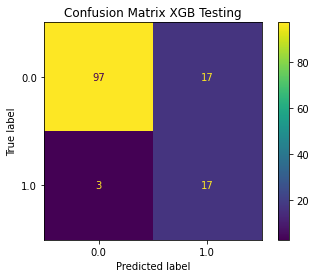

In [74]:
cm=confusion_matrix(y_test, y_pred_class)
disp=ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=xgb.classes_)
plt.savefig("figures/Confusion_Matrix_xgb")
disp.plot()
plt.title('Confusion Matrix XGB Testing')

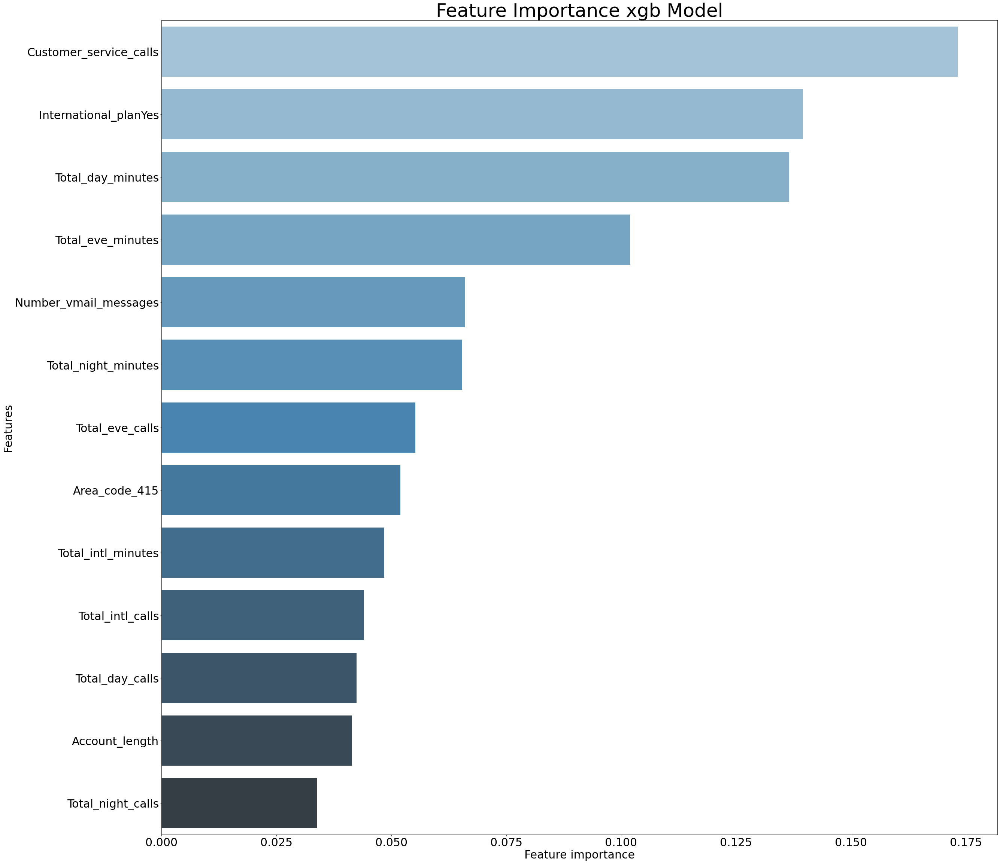

In [75]:
plot_feature_importances(xgb, 'xgb')